# HW- Visualizing features of a pretrained VGG
In this homework, we are going to try to visualize what neurons encode through optimization.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torchvision
from torchvision import models,transforms
from tqdm import tqdm
import PIL

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Using gpu: %s ' % torch.cuda.is_available())

Using gpu: True 


First, load the pretrained VGG16 model with torchvision, and print the architecture of the model. Describe the architecture and its composition.

In [2]:
### YOUR CODE HERE ###
model = models.vgg16(weights='DEFAULT').to(device)
print(model)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

The architecture comprises the following layers:

**13 Convolutional Layers**: It uses 3x3 convolutional filters with a stride of 1 pixel. The depth of the filters increases progressively across the layers, starting at 64 and expanding to 128, 256, and finally 512. 

**ReLU activation** : Each convolutional layer is followed by ReLU activation to add non-linear properties to the model. 

**5 MaxPooling Layers** : These layers serve to downscale the spatial dimensions of the input volumes by the taking the maximum of 2x2 entries. 

**Fully Connected Layers** : After the series of convolutional and max pooling layers, the network ends with three fully connected layers.

There is also dropout layer that is applied to reduce overfitting by randomly setting a fraction of input units.

# Part A - Visualizing the convolution filters

First, plot all the filters for the red channel of the first convolutional layer (there should be 64 filters in total) using `model.features[i].weight` to access the weights of the i-th layer of the feature extraction part of the model. Can you find filters that seem to encode edges? Is this method useful for other layers?

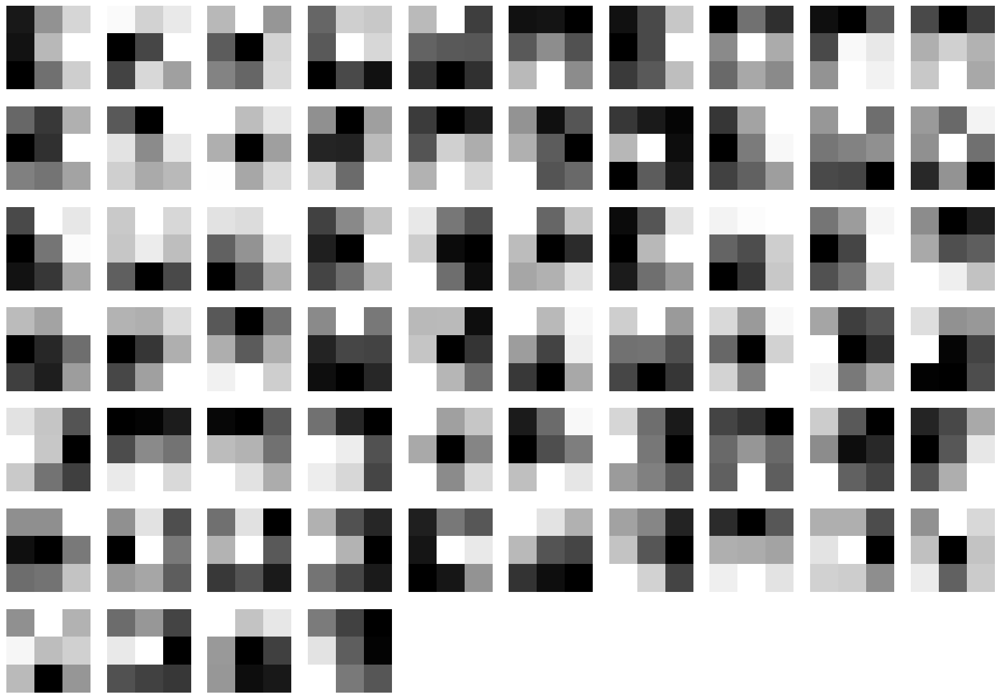

[0, 5, 6, 26]

In [3]:
### YOUR CODE HERE ###
filters = model.cpu().features[0].weight.size(0)
rows = filters // 10 + (1 if filters % 10 else 0)
fig, axs = plt.subplots(rows, 10, figsize=(20, 2*rows))
for i in range(filters):
    axs[i // 10, i % 10].imshow(model.cpu().features[0].weight[i][0].detach().numpy(), cmap='gray')
    axs[i // 10, i % 10].axis('off')
if filters % 10 != 0:
    for i in range(filters, rows * 10):
        axs[i // 10, i % 10].axis('off')
plt.show()
[0, 5, 6, 26]

Filters with high contrast in either horizontal or vertical orientations are effective at detecting edges. These filters are designed to respond strongly to intensity variations along horizontal or vertical lines, which often correspond to edges or contours of objects in an image. Therefore, when looking for filters that encode edges, those exhibiting high-contrast patterns in these directions are typically the most relevant.

When considering the applicability of this approach to other layers, its effectiveness varies depending on the layer's depth. In deeper layers, the network learns deeper things and filters typically learn to capture more abstract features, such as textures, object parts, or complex patterns. Visualizing filters in these layers might not yield as straightforward interpretations as in shallower layers. 

I'll try to apply some of those filters to an image from Internet

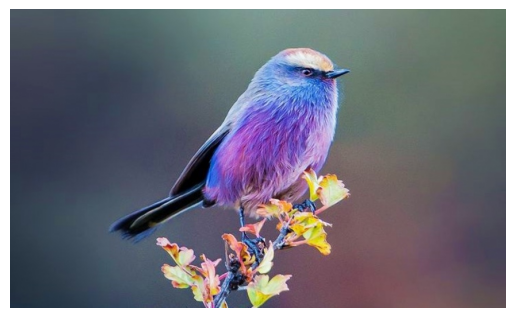

In [4]:
image = PIL.Image.open('oiseau.jpeg')
plt.imshow(image)
plt.axis('off');

In [5]:
def plot_f(channel):
    image = PIL.Image.open('oiseau.jpeg')
    transform = transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor()])
    image = transform(image).unsqueeze(0)
    filter = model.features[0].weight.data[channel]
    image_f = torch.nn.functional.conv2d(image, filter.unsqueeze(0))
    image_for_plot = image.squeeze().numpy().transpose(1, 2, 0)
    filter_for_plot = filter[0].detach().numpy()
    filtered_image_for_plot = image_f.squeeze().detach().numpy()
    
    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    axs[0].imshow(filter_for_plot, cmap='gray')
    axs[0].set_title('Filtre')
    axs[0].axis('off')
    axs[1].imshow(filtered_image_for_plot, cmap='gray')
    axs[1].set_title('Image Après Filtre')
    axs[1].axis('off')
    plt.show()

Below, we demonstrate that with filters featuring strong horizontal/vertical contrast, our previous observation holds true.

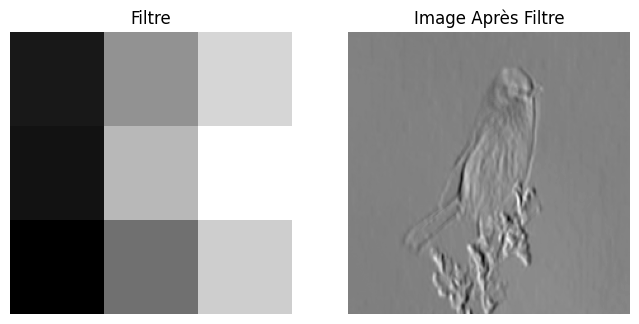

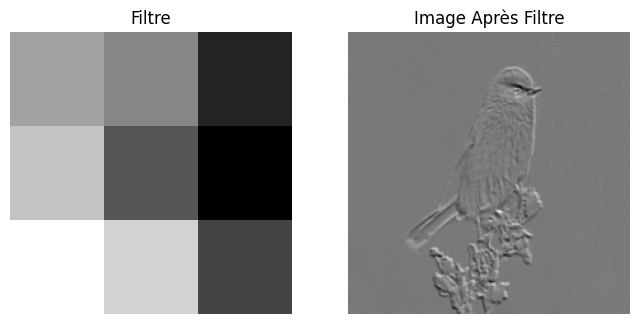

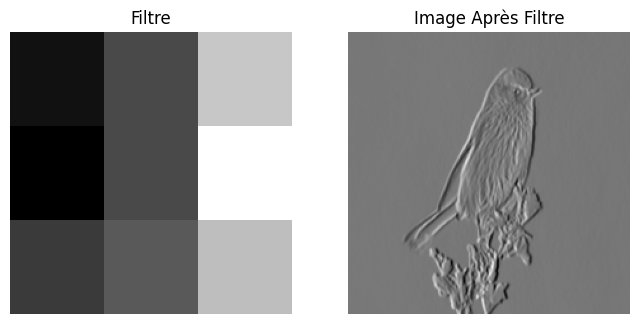

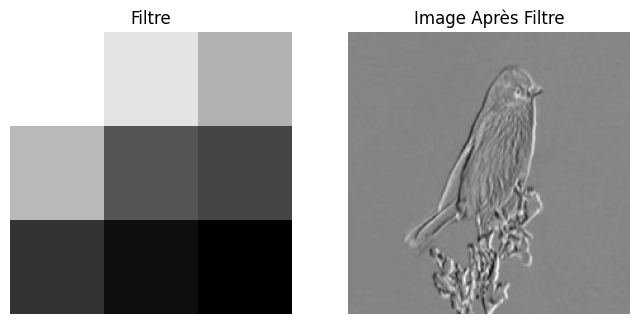

In [6]:
for i in [0, 56, 6, 55]:
    plot_f(i)

Below, we demonstrate that with filters featuring low contrast, our previous observation holds true.

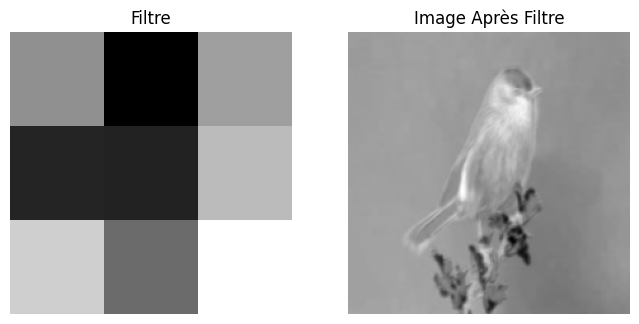

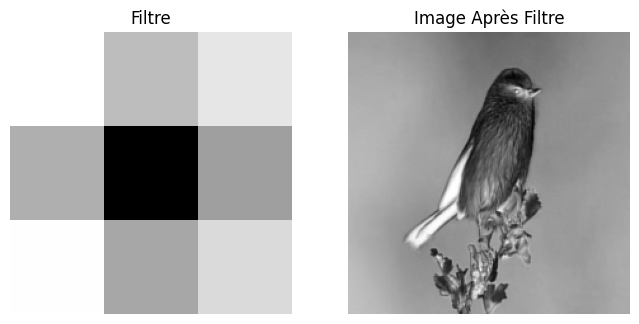

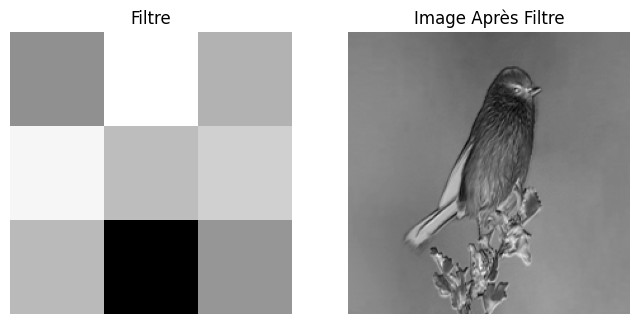

In [7]:
for i in [13, 12, 60]:
    plot_f(i)

# Part B - Visualizing channel activations through image optimization
## B.1 - First implementation
Create a module `ChannelActivation(layer, channel)` that returns the average activation (i.e. output value) of channel `channel` of layer `layer` of the VGG features (both indexed starting from 0).

In [8]:
### YOUR CODE HERE ###
class ChannelActivation(nn.Module):
  def __init__(self, layer, channel):
    super(ChannelActivation, self).__init__()
    global model # I made the model global to access it when using this class
    self.features = nn.Sequential(*list(model.features[:layer + 1]))
    self.channel = channel

  def forward(self, x):
    x = self.features(x)
    avg = x[:, self.channel, :, :].mean()
    return avg

Our objective is to find which patterns are recognized by a given channel. To do so, we will follow the approach of [this Distill article](https://distill.pub/2017/feature-visualization/) and find images that lead to the highest possible channel activation.

First, create a random (colored) image of size 128x128 (i.e. tensor of shape (3, 128, 128)), initialized with value at random between 0.4 and 0.6 (i.e. grey + small perturbation). Then, perform 200 steps of Adam (with lr=0.01) to maximize the activation of channel 4 of layer 1. Plot the image after 0, 10, 50, 100 and 200 iterations. You should see a pink or blue saturated image with several horizontal lines, indicating that the channel probably recognizes horizontal edges.

**NB1:** Careful, by default, optimizers minimize their objective, not maximize it!

**NB2:** Tensors are created, by default, with `requires_grad` set to False. To do optimize on such a tensor, first set this field to True.

**NB3:** The parameters given to an optimizer should be on the cpu. If you use a gpu, you thus need to keep two versions of the image: 1) a cpu version given to the optimizer, and 2) a gpu version, created at each iteration of the optimization with x.to(device), and used to compute the gradient.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


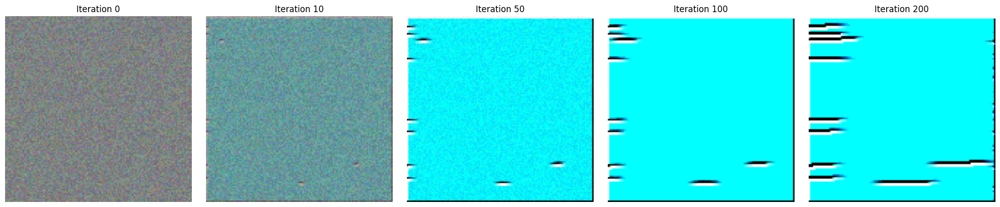

In [9]:
### YOUR CODE HERE ###
image = torch.Tensor(3, 128, 128).uniform_(0.4, 0.6).to(device).requires_grad_(True)

optimizer = torch.optim.Adam([image], lr=0.01)

images = [] 
steps = [0, 10, 50, 100, 200]  

for s in range(201):
    optimizer.zero_grad()
    loss = -ChannelActivation(layer=1, channel=4).to(device)(image.unsqueeze(0))  
    loss.backward()
    optimizer.step()

    if s in steps:
        images.append((s, image.detach().cpu().permute(1, 2, 0).numpy()))

fig, axes = plt.subplots(1, 5, figsize=(20, 4))

for (iteration, img), ax in zip(images, axes):
    ax.imshow(img)
    ax.set_title(f"Iteration {iteration}")
    ax.axis('off')

plt.tight_layout()
plt.show();

## B.2 - Improving stability with clipping and normalization
Compute the highest and lowest values of the image. What is the issue?

In [10]:
### YOUR CODE HERE ###
max, min = image.max().item(), image.min().item()
max, min

(3.5718798637390137, -2.461599826812744)

There is a problem of **over Saturation**.

The problem arises because the code optimizes the image to maximize the activation of a specific channel in a convolutional neural network, but it doesn't ensure that the image values stay within a valid range (e.g., [0, 1] for normalized images). Allowing the image values to increase without bounds can lead to numerical instability and other optimization issues.

To avoid (over) saturation, clip the image pixels to $[0.2,0.8]$ after each optimization step using `input_image.data = input_image.data.clip(0.2, 0.8)`. You should now see several clear horizontal lines in a blue background.

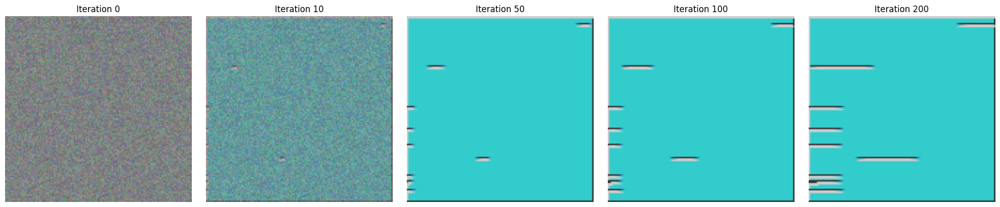

In [11]:
### YOUR CODE HERE ###
image = torch.Tensor(3, 128, 128).uniform_(0.4, 0.6).to(device).requires_grad_(True)

optimizer = torch.optim.Adam([image], lr=0.01)

images = [] 
steps = [0, 10, 50, 100, 200]  

for s in range(201):
    optimizer.zero_grad()
    loss = -ChannelActivation(layer=1, channel=4).to(device)(image.unsqueeze(0))  
    loss.backward()
    optimizer.step()
    
    image.data = image.data.clip(0.2, 0.8)
    if s in steps:
        images.append((s, image.detach().cpu().permute(1, 2, 0).numpy()))

fig, axes = plt.subplots(1, 5, figsize=(20, 4))

for (iteration, img), ax in zip(images, axes):
    ax.imshow(img)
    ax.set_title(f"Iteration {iteration}")
    ax.axis('off')

plt.tight_layout()
plt.show();

One issue with our current code, is that VGG was trained on **normalized** images, and thus is not adapted to our input image. To normalize the image, we will use **transforms**.

Create a function `create_activation_image(layer, channel, transform=None, image_size=128, show_steps=False)` that maximizes the corresponding channel activation on an image of size `image_size`, and first applies `transform` to the image before computing the gradient of the activation. The function should return the final image after 200 steps, and plot intermediate images for the steps 0,10,50,100,200 if `show_steps=True`.

Then, test your function with `transform=transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])`. Is this better? You should now see a horizontal pattern with lines.

In [12]:
def create_activation_image(layer, channel, transform=None, image_size=128, show_steps=False):
    images = [] 
    image = torch.Tensor(3, image_size, image_size).uniform_(0.4, 0.6).to(device)
    if transform:
        image = transform(image)
    image = image.requires_grad_(True).to(device)
    
    optimizer = torch.optim.Adam([image.requires_grad_()], lr=0.01)

    for s in range(201):
        optimizer.zero_grad()
        # Taking negative value to maximize the function with the optimizer
        loss = -ChannelActivation(layer, channel).to(device)(image.unsqueeze(0)) 
        loss.backward()
        optimizer.step()

        image.data = image.data.clip(0.2, 0.8)

        if show_steps and s in [0, 10, 50, 100, 200]:
            img_clone = image.cpu().detach().clone().numpy().transpose(1, 2, 0)
            images.append(img_clone)  

    if show_steps:
        fig, axes = plt.subplots(1, 5, figsize=(20, 4))
        for ax, img in zip(axes.flat, images):  
            ax.imshow(img)
            ax.axis('off')
        plt.tight_layout()
        plt.show()

    return image.detach()


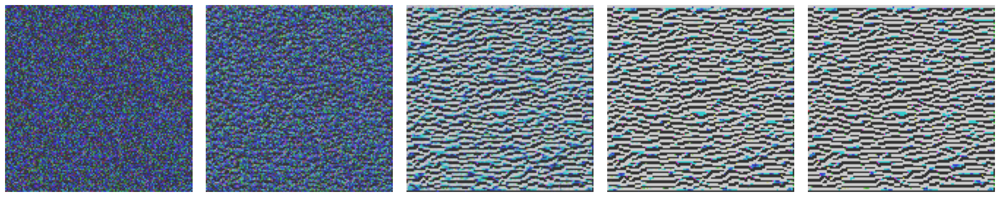

In [13]:
transformation = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
layer_1 = create_activation_image(layer=1, channel=4, transform=transformation, image_size=128, show_steps=True)

**Yes**, applying the normalization transform is better because it aligns the image with the normalization scheme used during the training of the model. This alignment helps the optimization process to converge more effectively and allows the model to recognize patterns more accurately.
We can see that there is lot of lines which indicates that it starts to learn the pattern of th image.

Now test your function on channel 0 of layer 20. The pattern that appears should vagely resemble fish scales.

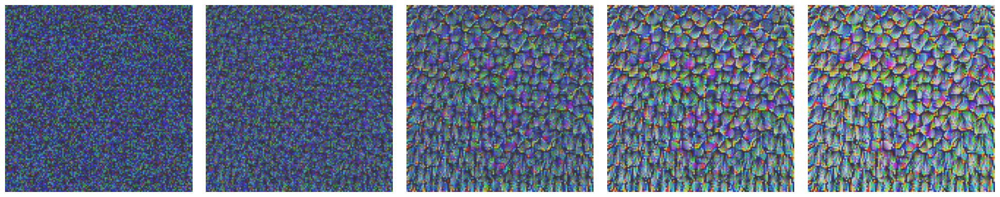

In [14]:
### YOUR CODE HERE ###
layer_20 = create_activation_image(layer=20, channel=0, transform=transformation, image_size=128, show_steps=True)

## B.3 - Transformation robustness
Large neural network are prone to adversarial attacks, i.e. a small well-crafted additive noise can dramatically change the output of the model, and thus lead to incorrect classification. For our purpose, this is an issue, as the optimization algorithm may find such very specific noise instead of more valuable visual patterns.

To avoid this issue and further improve our images, we are thus going to apply small random perturbations to the image before computing the gradient. This will prevent the optimizer from optimizing the noise, and overall increase the stability of our process.

To do so, add a composition of several transforms (before the normalization):

1.   A small pixel noise with `transforms.Lambda(lambda x: x + 0.001 * (2 * torch.rand_like(x) - 1))`
2.   A random affine transform with `transforms.RandomAffine(degrees=5, translate=(0.1,0.1), scale=(0.9,1.1))`
3.   A random crop of size 96 (to reduce the size of the image)
4.   Random local fluctations with `transforms.ElasticTransform(alpha=50.)`

Compare the activation images with and without these random transformations. Is the pattern more visible?



In [15]:
transformations = transforms.Compose([
    transforms.Lambda(lambda x: x + 0.001 * (2 * torch.rand_like(x) - 1)),
    transforms.RandomAffine(degrees=5, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    transforms.RandomCrop(96),
    transforms.ElasticTransform(alpha=50.)
    ])

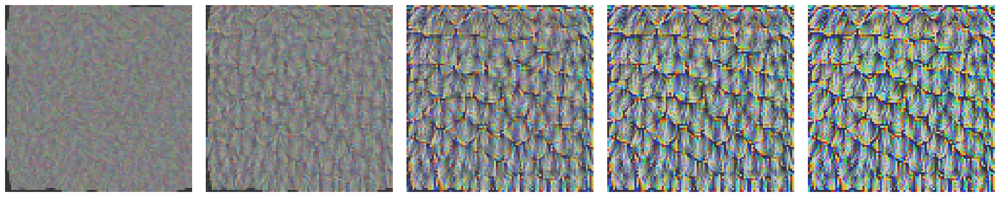

In [16]:
### YOUR CODE HERE ###
layer_20 = create_activation_image(layer=20, channel=0, transform=transformations, show_steps=True)

**Yes**, by incorporating small random perturbations before computing the gradient, the activation images are enhanced, making patterns more discernible. These perturbations prevent the optimization process from fixating solely on crafting noise, ensuring that the resulting images capture more meaningful visual patterns.

To see what the transformation is doing to an image, apply the random transformations (without normalization) to the following simple image, and show 5 randomly transformed images.

In [17]:
tensor_to_image = lambda tensor : tensor.cpu().permute(1, 2, 0).numpy()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


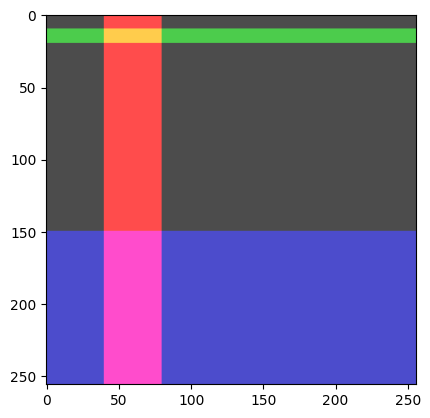

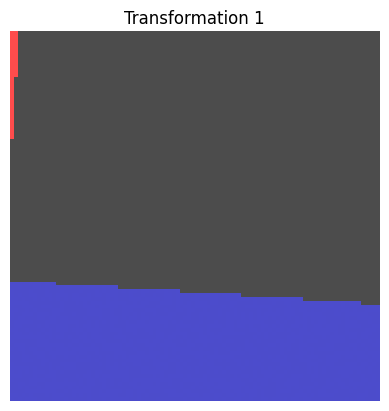

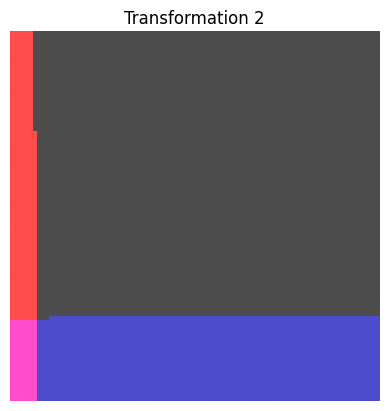

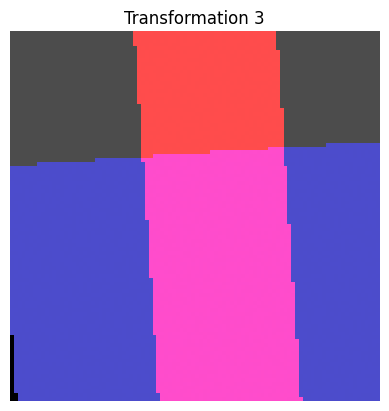

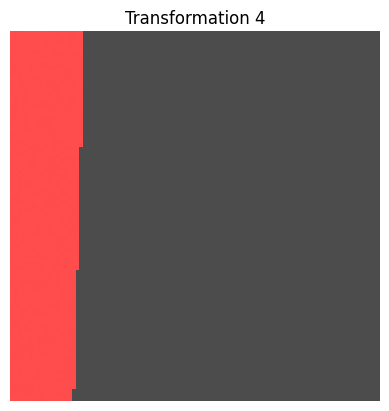

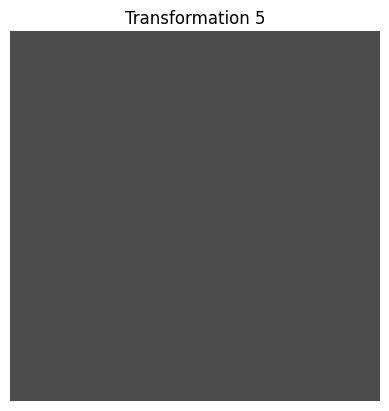

In [18]:
sample_image = 0.3 * torch.ones(3, 256, 256)
sample_image[0,:,40:80] += 0.7
sample_image[1,10:20,:] += 0.5
sample_image[2,150:,:] += 0.5
plt.imshow(tensor_to_image(sample_image));
### YOUR CODE HERE ###
transformations = transforms.Compose([
    transforms.Lambda(lambda x: x + 0.001 * (2 * torch.rand_like(x) - 1)),
    transforms.RandomAffine(degrees=5, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    transforms.RandomCrop(96)
])

for i in range(5):
    plt.figure()
    plt.imshow(tensor_to_image(transformations(sample_image)))
    plt.title(f"Transformation {i+1}")
    plt.axis('off')
plt.show();

## B.4 - Final visualization
Finally, show the activation images for the first 5 channels of layers [1, 10, 20, 30]. You should be able to see a gradual complexification of the patterns.

**PS1:** Our method seems unable to find meaningful patterns for the last layer. One issue is probably that the random crop imposes that all regions on the image look similar (as they all should have a high channel activation), thus preventing larger and more complex patterns to emerge from the optimization.

**PS2:** You can also try other layers and channels to find interesting patterns!

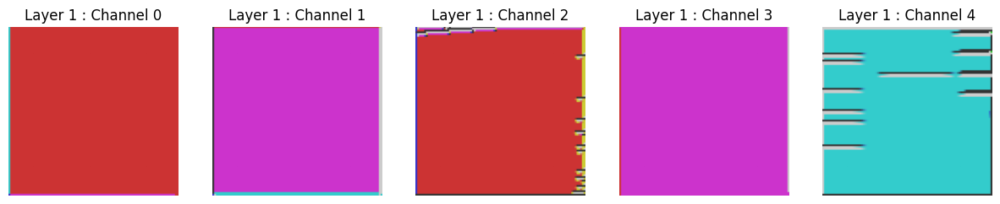

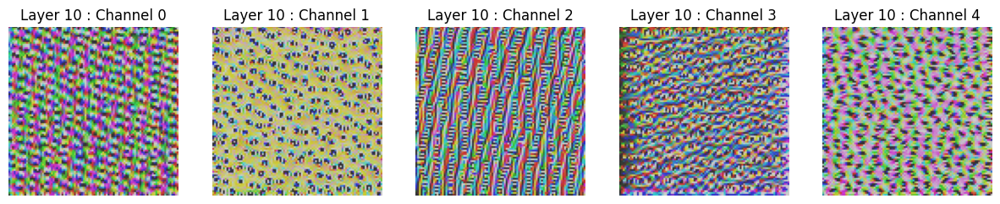

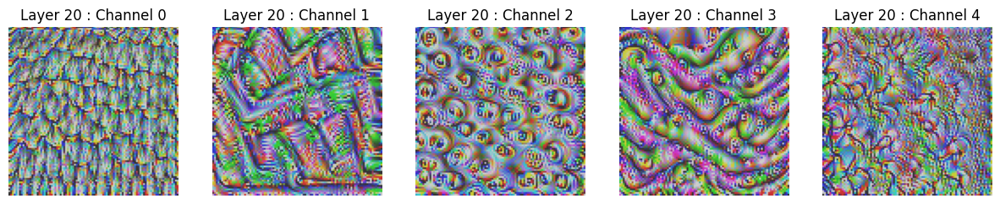

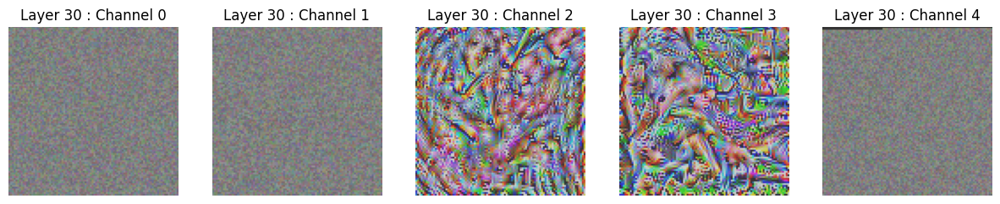

In [28]:
### YOUR CODE HERE ###
for layer in [1, 10, 20, 30]:
    plt.figure(figsize=(15, 3))
    for i, channel in enumerate([0, 1, 2, 3, 4]):
        activation_image = create_activation_image(layer=layer, channel=channel, transform=transformations, show_steps=False)
        plt.subplot(1, 5, i + 1)
        plt.imshow(tensor_to_image(activation_image))
        plt.title(f"Layer {layer} : Channel {channel}")
        plt.axis('off')
    plt.show()

We are able to see a gradual complexification of the patterns in layers.
Let's see for other layers that succeed to see evolution 

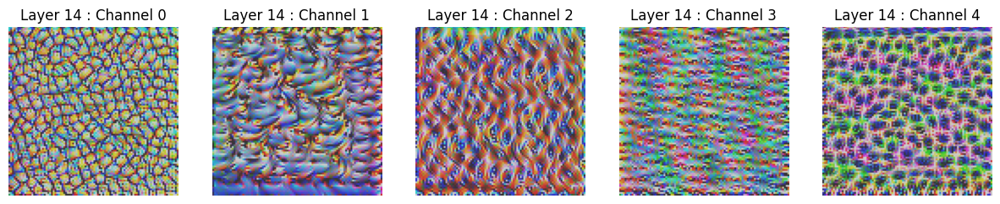

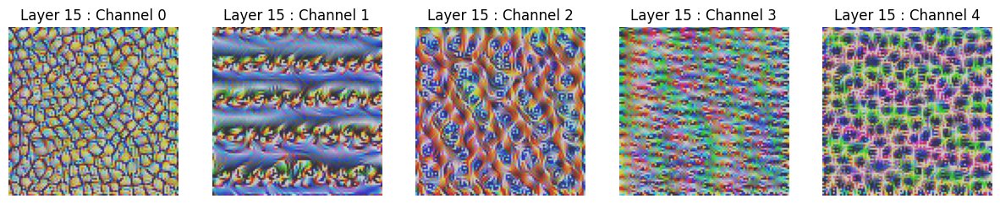

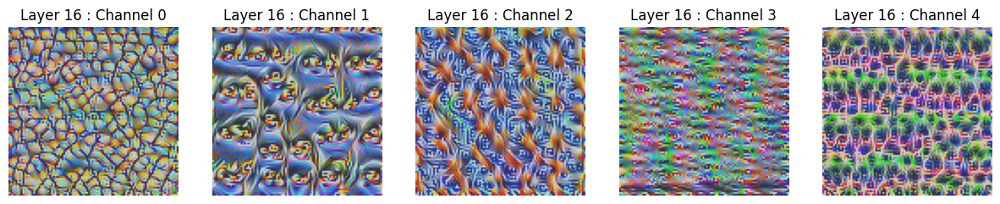

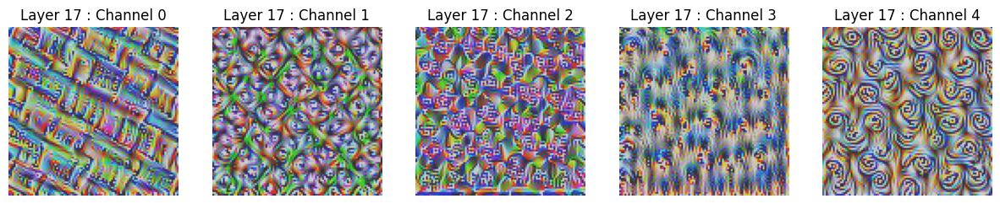

In [42]:
### YOUR CODE HERE ###
for layer in [14, 15, 16, 17]:
    plt.figure(figsize=(15, 3))
    for i, channel in enumerate([0, 1, 2, 3, 4]):
        activation_image = create_activation_image(layer=layer, channel=channel, transform=transformations, show_steps=False)
        plt.subplot(1, 5, i + 1)
        plt.imshow(tensor_to_image(activation_image))
        plt.title(f"Layer {layer} : Channel {channel}")
        plt.axis('off')
    plt.show()